In [1]:
import numpy as np
import matplotlib.pyplot as plt
import logging
from pathlib import Path

from src.paths import project_dir
from src.datasets.volumetric_datasets import VolumeDatasetInMemory
from src.preprocessing.main_create_v7_spheres_dataset import interface_type_generator
from src.interface_representation.interface_types import InterfaceType

logging.basicConfig(level=logging.INFO)

In [2]:
base_dir = Path('../../../src/preprocessing')

In [3]:
interface_types = [
        InterfaceType.SIGNED_DISTANCE_EXACT,
        InterfaceType.SIGNED_DISTANCE_APPROXIMATE,
        InterfaceType.HEAVISIDE,
        InterfaceType.TANH_EPSILON,
    ]

epsilons = [1/128, 1/64, 1/32, 1/16]

datasets = []

for interface_type, epsilon, outdir in interface_type_generator(interface_types, epsilons):
    datasets.append(VolumeDatasetInMemory(base_dir / outdir, split='val', debug=False))

INFO:src.datasets.volumetric_datasets:Constructed splits of size (number of runs NOT snapshots): train=2000, val=500
INFO:src.datasets.volumetric_datasets:Loaded 500 files for split val
INFO:src.datasets.volumetric_datasets:First file: ../../src/preprocessing/data/v7_spheres/SIGNED_DISTANCE_EXACT/spheres_305.npz
INFO:src.datasets.volumetric_datasets:Generated 500 samples of volumetric data
INFO:src.datasets.volumetric_datasets:Each sample has shape torch.Size([1, 64, 64, 64])
INFO:src.datasets.volumetric_datasets:Constructed splits of size (number of runs NOT snapshots): train=2000, val=500
INFO:src.datasets.volumetric_datasets:Loaded 500 files for split val
INFO:src.datasets.volumetric_datasets:First file: ../../src/preprocessing/data/v7_spheres/SIGNED_DISTANCE_APPROXIMATE/spheres_305.npz
INFO:src.datasets.volumetric_datasets:Generated 500 samples of volumetric data
INFO:src.datasets.volumetric_datasets:Each sample has shape torch.Size([1, 64, 64, 64])
INFO:src.datasets.volumetric_dat

In [4]:
# First, check that all datasets have same length
lengths = [len(dataset) for dataset in datasets]
assert all(length == lengths[0] for length in lengths)

In [5]:

def visualise_dataset_sample(arr):
    arr = arr.squeeze()

    fig, axs = plt.subplots(1, 3, figsize=(9, 3))
    im = axs[0].imshow(arr[32, :, :])
    fig.colorbar(im, ax=axs[0])
    im = axs[1].imshow(arr[:, 32, :])
    fig.colorbar(im, ax=axs[1])
    im = axs[2].imshow(arr[:, :, 32])
    fig.colorbar(im, ax=axs[2])
    plt.show()
    plt.close()


InterfaceType.SIGNED_DISTANCE_EXACT


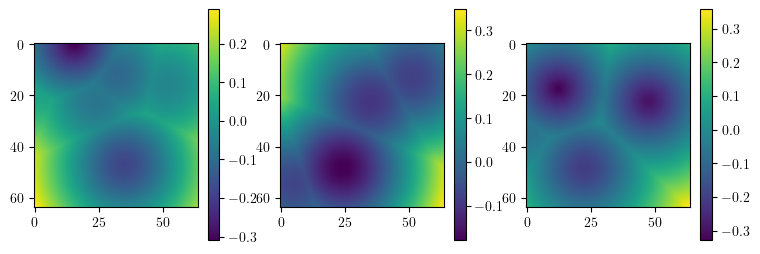

InterfaceType.SIGNED_DISTANCE_APPROXIMATE


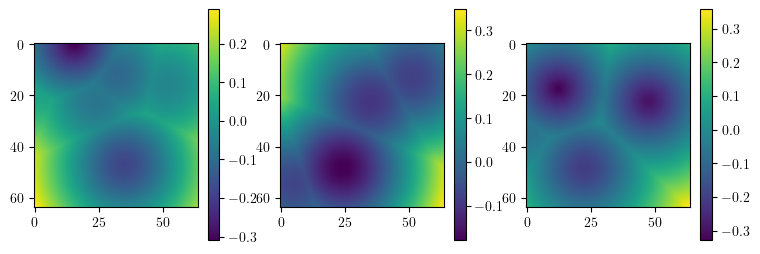

InterfaceType.HEAVISIDE


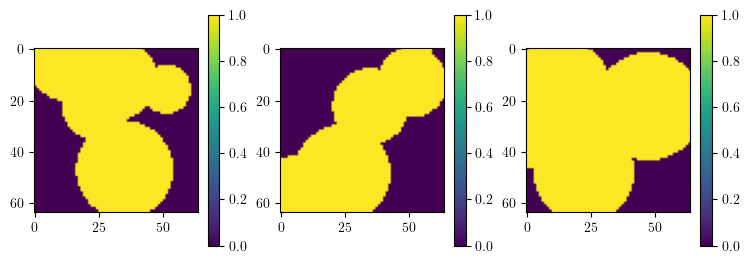

InterfaceType.TANH_EPSILON


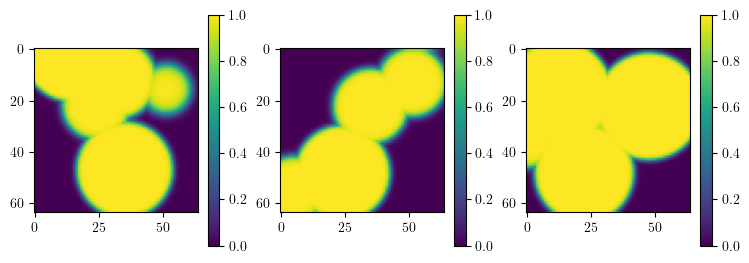

InterfaceType.TANH_EPSILON


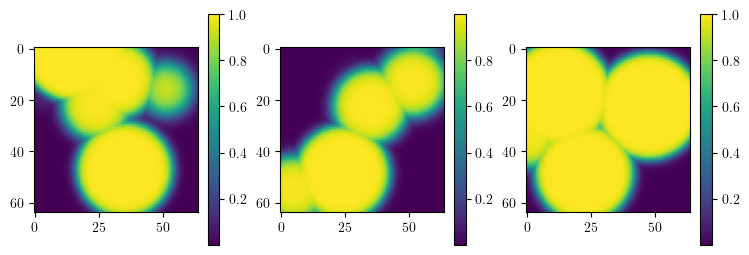

InterfaceType.TANH_EPSILON


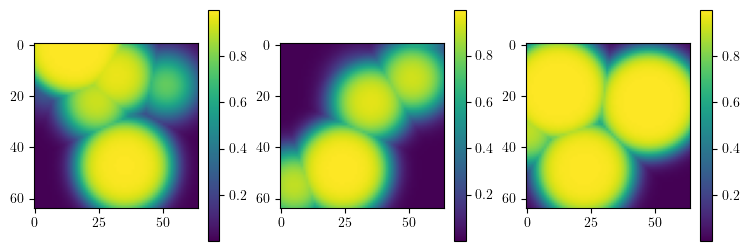

InterfaceType.TANH_EPSILON


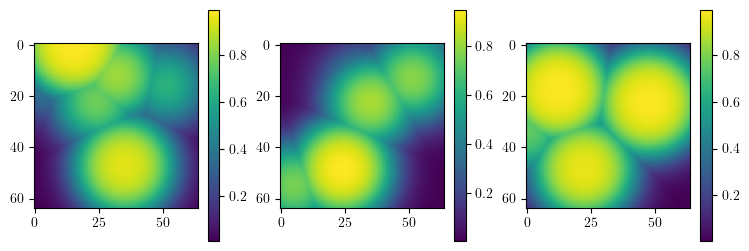

In [6]:
# Visualise first sample from each dataset

for dataset, interface_type in zip(datasets, interface_type_generator(interface_types, epsilons)):
    print(interface_type[0])
    visualise_dataset_sample(dataset[0])


In [7]:
def visualise_grad_magnitude(arr):
    dx = 1 / 64
    arr = arr.squeeze()
    grad = np.gradient(arr, dx)
    grad_magnitude = np.sqrt(np.sum(np.square(grad), axis=0))

    fig, axs = plt.subplots(1, 3, figsize=(9, 3))
    im = axs[0].imshow(grad_magnitude[32, :, :])
    fig.colorbar(im, ax=axs[0])
    im = axs[1].imshow(grad_magnitude[:, 32, :])
    fig.colorbar(im, ax=axs[1])
    im = axs[2].imshow(grad_magnitude[:, :, 32])
    fig.colorbar(im, ax=axs[2])
    plt.show()
    plt.close()
    

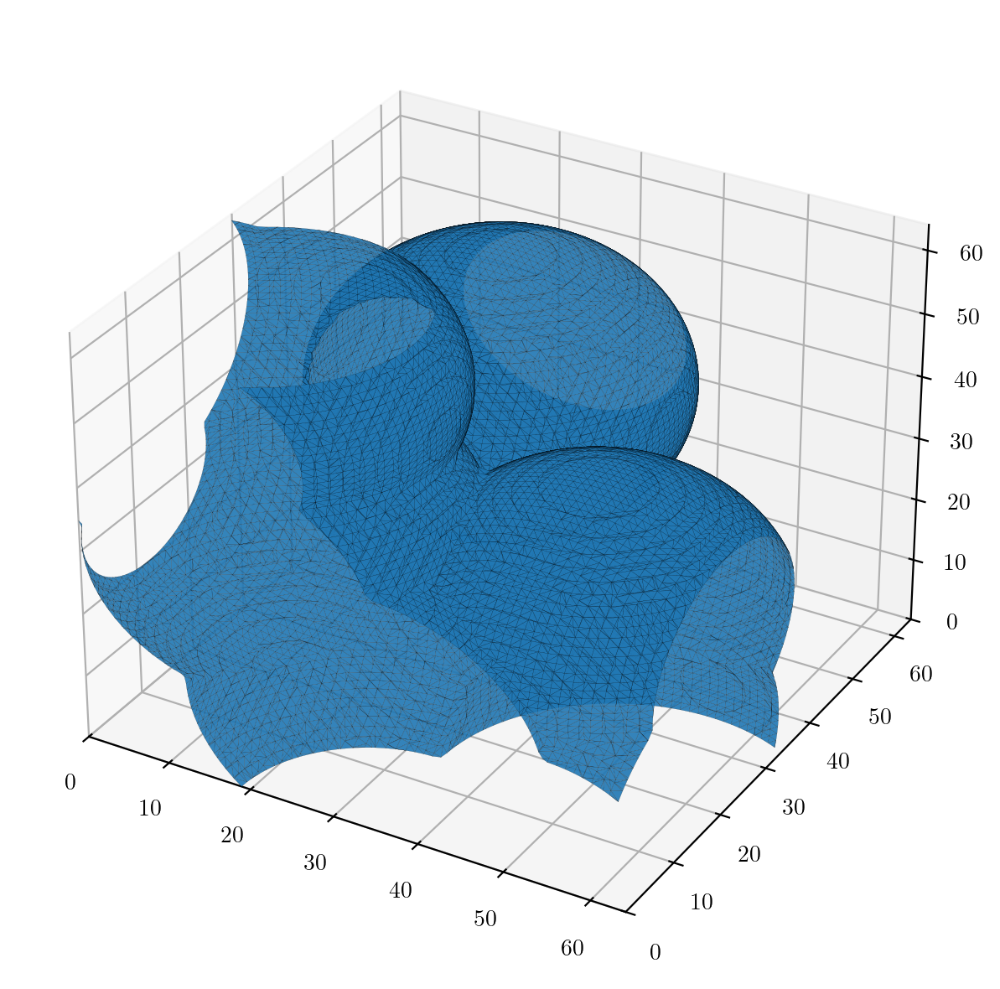

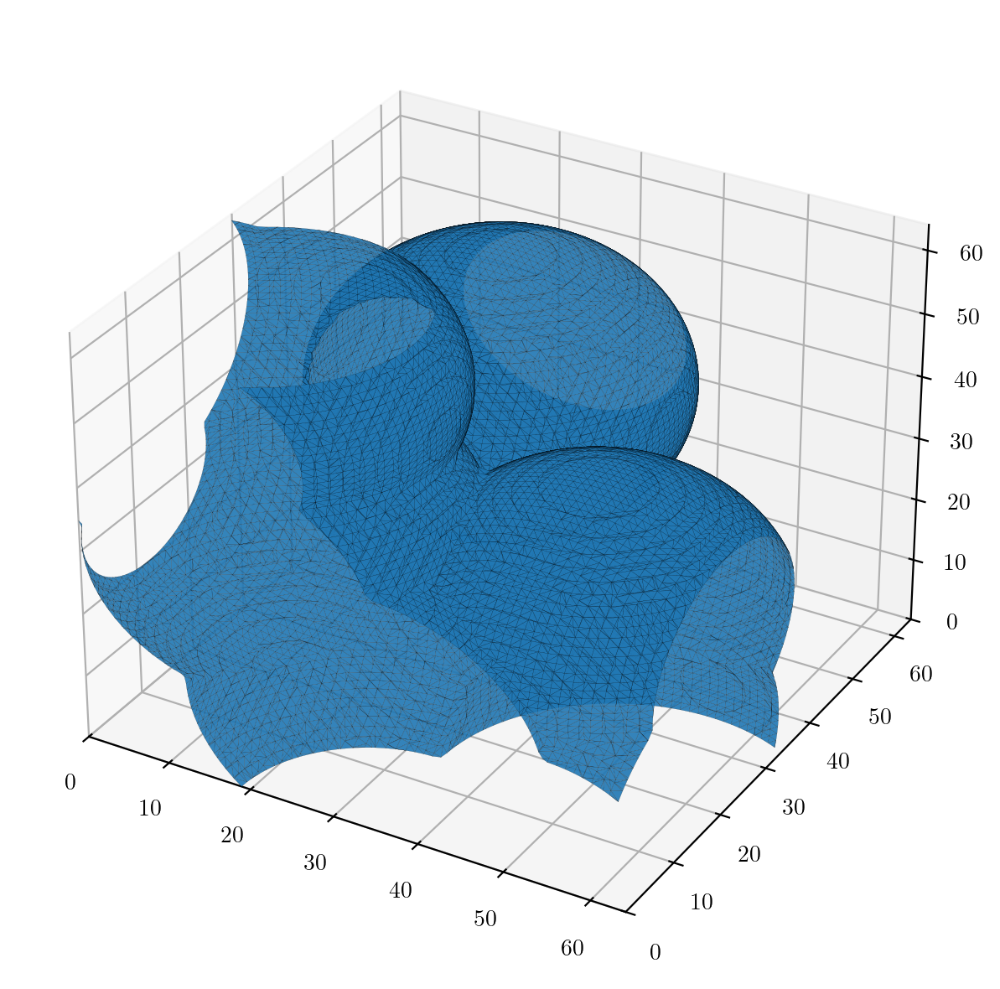

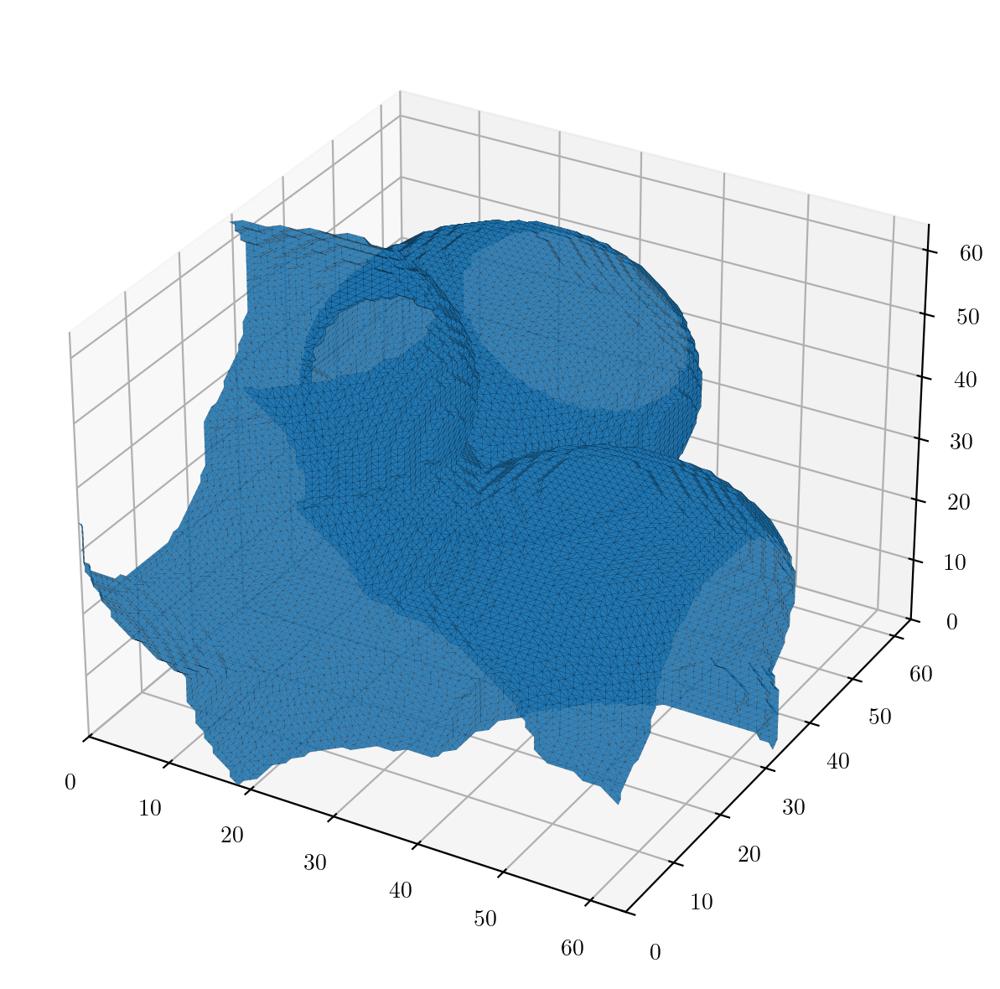

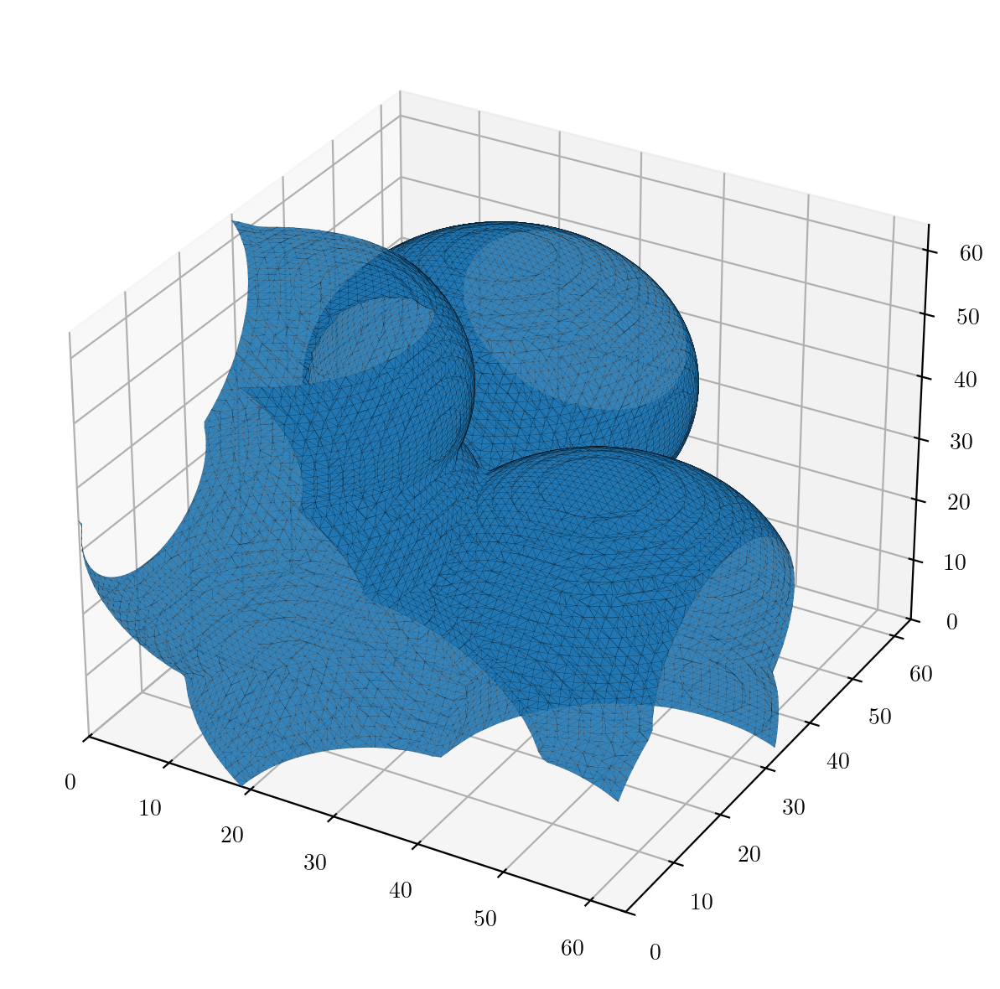

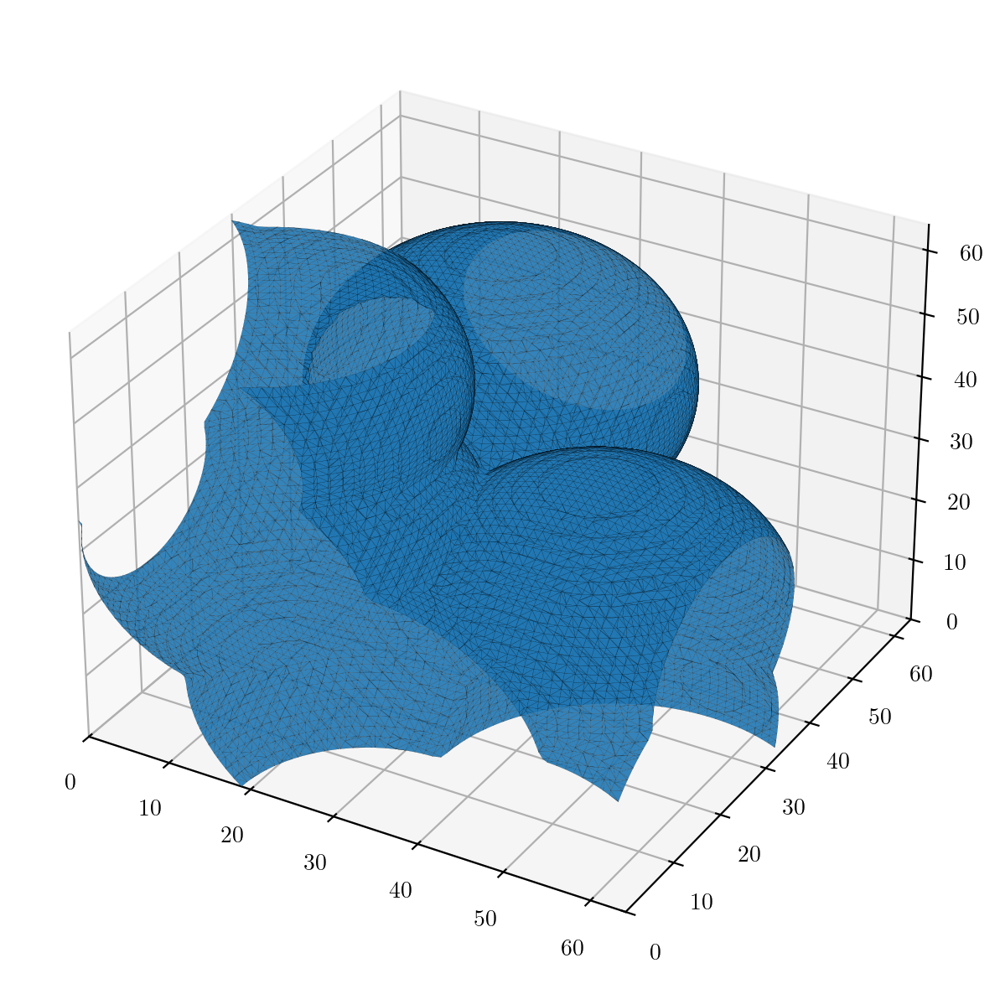

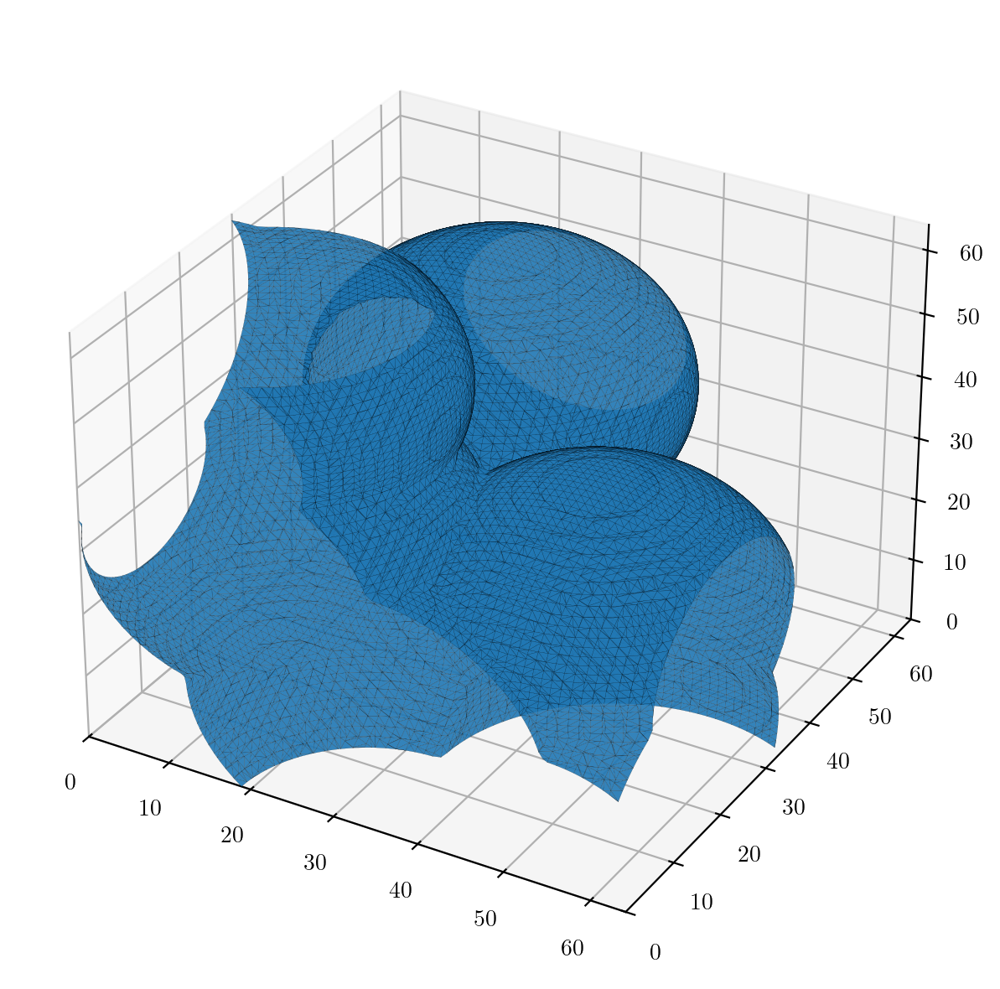

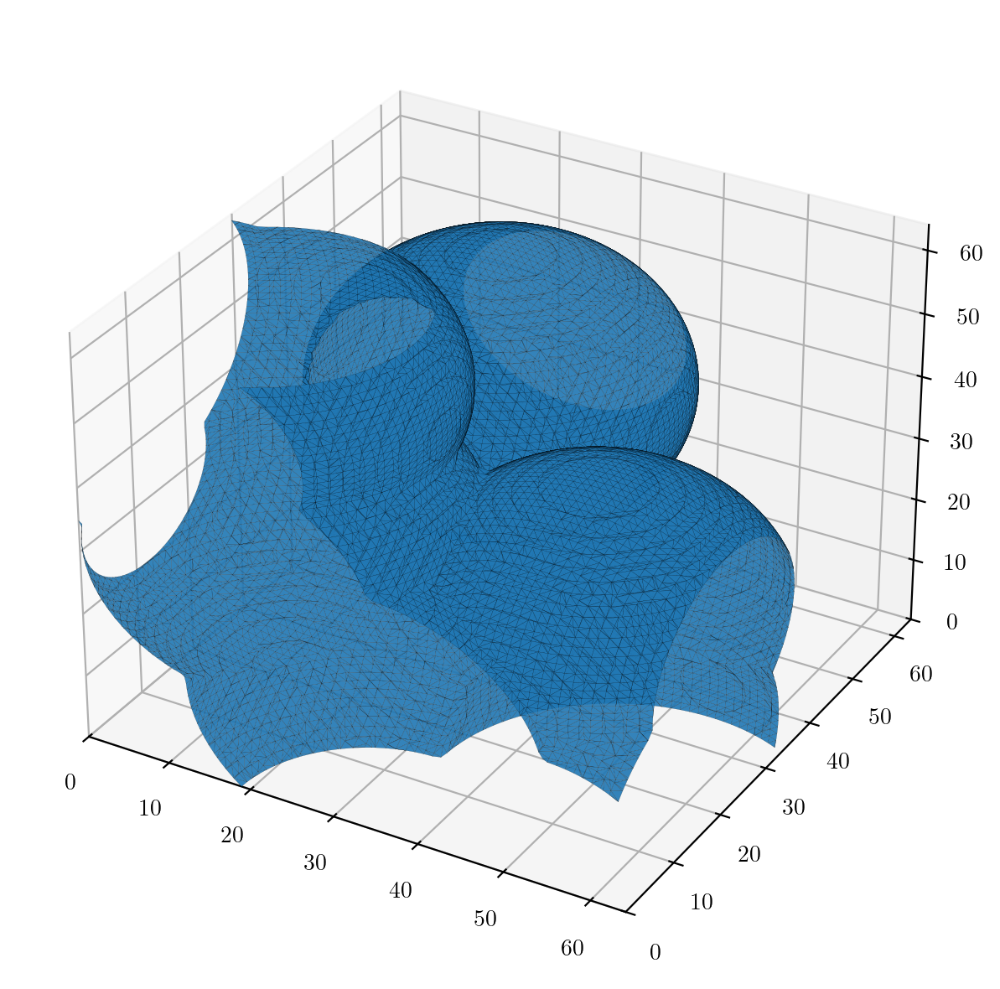

In [8]:

# Visualise 3D reconstruction of first sample from each dataset

from src.plotting_utils import show_isosurface_plot_from_arr

for dataset, interface_type in zip(datasets, interface_type_generator(interface_types, epsilons)):
    if interface_type[0] == InterfaceType.SIGNED_DISTANCE_APPROXIMATE:
        level = 0.0
    elif interface_type[0] == InterfaceType.SIGNED_DISTANCE_EXACT:
        level = 0.0
    else:
        level = 0.5

    show_isosurface_plot_from_arr(dataset[0].squeeze().numpy(), level=level, N=64, verbose=False)


InterfaceType.SIGNED_DISTANCE_EXACT


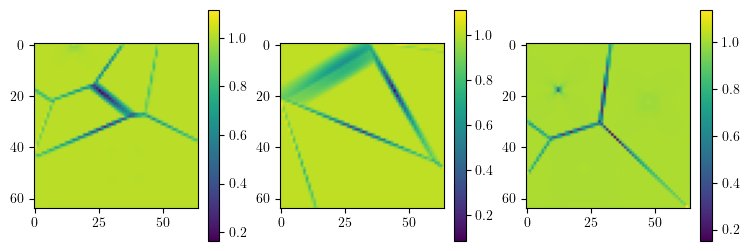

InterfaceType.SIGNED_DISTANCE_APPROXIMATE


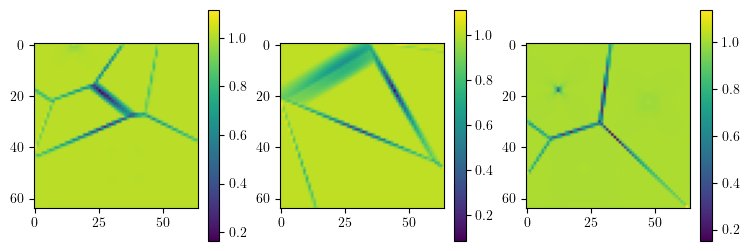

InterfaceType.HEAVISIDE


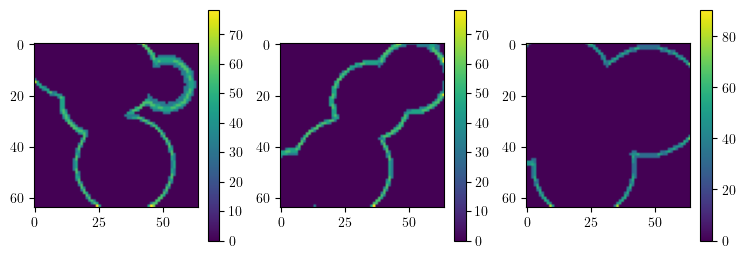

InterfaceType.TANH_EPSILON


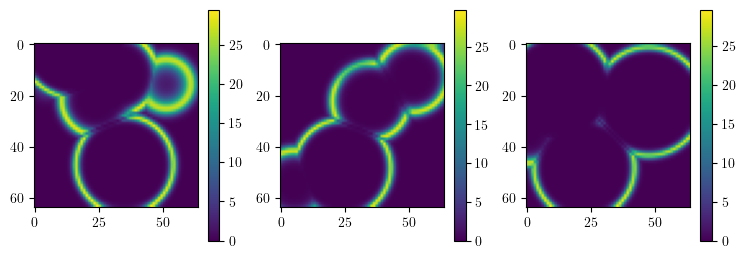

InterfaceType.TANH_EPSILON


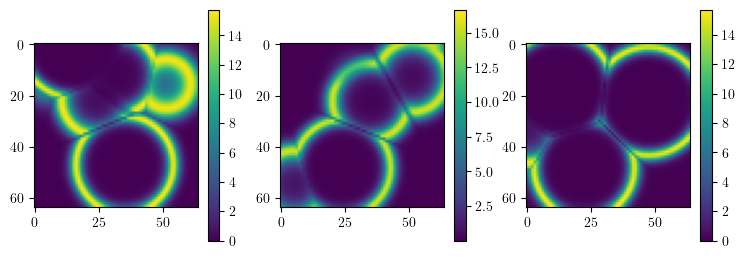

InterfaceType.TANH_EPSILON


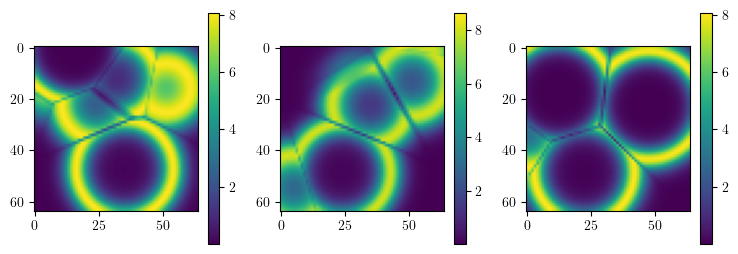

InterfaceType.TANH_EPSILON


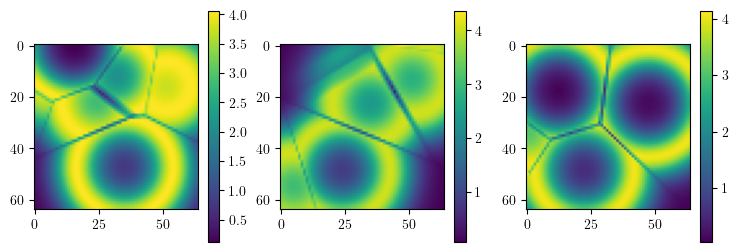

In [9]:
# Visualise gradient magnitude of first sample from each dataset

for dataset, interface_type in zip(datasets, interface_type_generator(interface_types, epsilons)):
    print(interface_type[0])
    visualise_grad_magnitude(dataset[0])


In [10]:
# Get the volume fraction dataset and check the distribution of total occupied volume over samples

it = InterfaceType.HEAVISIDE
dataset = SpheresDataset(base_dir / interface_type_generator([it], [None]).__next__()[2], split='val', debug=False)

vol_fracs = []

for i in range(len(dataset)):
    vol_fracs.append(np.sum(dataset[i].squeeze().numpy()) / dataset[i].numel())
    
plt.hist(vol_fracs, bins=20)

NameError: name 'SpheresDataset' is not defined